# Experiments for determining the optimal parameters

In [1]:
# External Imports
import numpy as np

# Internal Imports
from inpainter import *

## Comparison in terms of percentage of erased pixels
We run an experiment with a fixed relaxation parameter $\lambda=1$ and a fixed step size $\rho=1$, and vary the percentage of randonly erased pixels between $10\%$ and $100\%$. Keep in mind this will take roughly $10$ minutes to run.

Static Alpha:   0%|          | 0/30 [00:00<?, ?Value of ratio/s]

Inertial Alpha:   0%|          | 0/30 [00:00<?, ?Value of ratio/s]

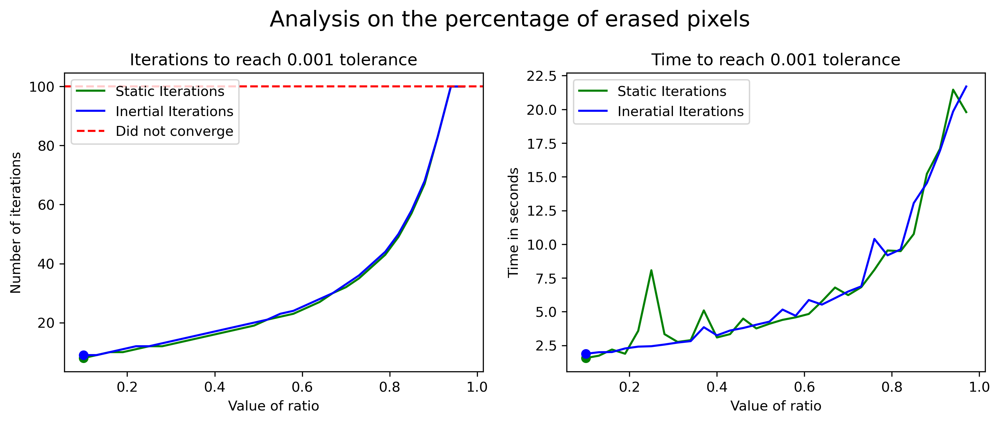

  ratio    Its Static    Time Static    Its Inertial    Time Inertial
-------  ------------  -------------  --------------  ---------------
   0.1              8        1.56167               9          1.87777
   0.13             9        1.73528               9          1.99308
   0.16            10        2.1919               10          2.00615
   0.19            10        1.88155              11          2.27343
   0.22            11        3.5807               12          2.40789
   0.25            12        8.07092              12          2.43854
   0.28            12        3.33453              13          2.56347
   0.31            13        2.75759              14          2.7093
   0.34            14        2.88746              15          2.816
   0.37            15        5.09284              16          3.8478
   0.4             16        3.08694              17          3.24644
   0.43            17        3.3362               18          3.60241
   0.46            18   

In [2]:
Exp = ExpRatio(np.arange(0.1, 0.99, 0.03), lamb = 1, rho = 1)
Exp.run(max_iterations = 100, tolerance = 1e-3, title="Analysis on the percentage of erased pixels")

## Comparison in terms of the step size
We run an experiment with a fixed relaxation parameter $\lambda=1$, whilst iterating over some representative values of the step size $\rho$, for an image with $50\%$ of its pizels randomly erased. This runs in around $6$ minutes.

Static Alpha:   0%|          | 0/20 [00:00<?, ?Value of rho/s]

Inertial Alpha:   0%|          | 0/20 [00:00<?, ?Value of rho/s]

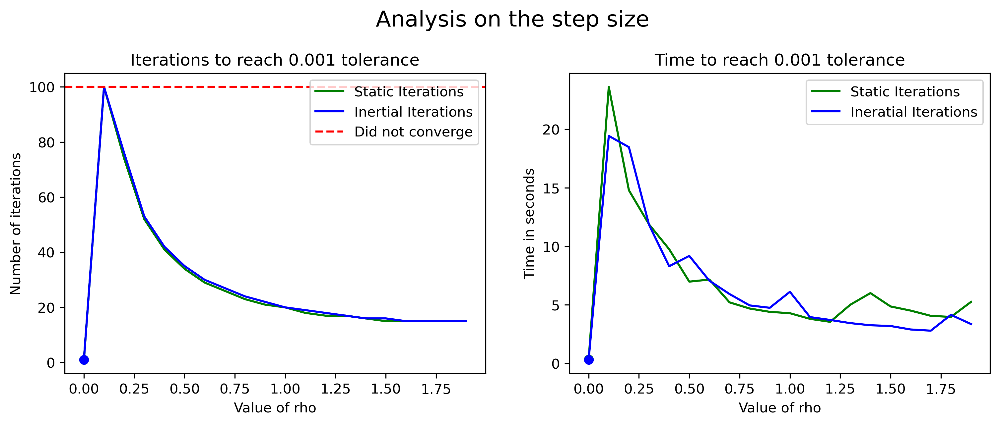

  rho    Its Static    Time Static    Its Inertial    Time Inertial
-----  ------------  -------------  --------------  ---------------
  0               1       0.342513               1         0.316287
  0.1           100      23.6187               100        19.4334
  0.2            74      14.7889                76        18.4746
  0.3            52      11.8791                53        11.8414
  0.4            41       9.75802               42         8.30295
  0.5            34       6.98704               35         9.18476
  0.6            29       7.16421               30         7.06368
  0.7            26       5.21692               27         5.92814
  0.8            23       4.68989               24         4.95602
  0.9            21       4.40558               22         4.75334
  1              20       4.29011               20         6.11823
  1.1            18       3.80812               19         3.95747
  1.2            17       3.55421               18         3.7

In [3]:
Exp = ExpRho(np.arange(0, 2, 0.1), lamb = 1, ratio = 0.5)
Exp.run(max_iterations = 100, tolerance = 1e-3, title="Analysis on the step size")

## Comparison in terms of the relaxation parameter
We now run an experiment with a fixed  step size $\rho=1$, whilst iterating over some representative values of the relaxation parameter $\lambda$, for an image with $50\%$ of its pixels randomly erased. This takes roughly $3$ minutes to execute.

Static Alpha:   0%|          | 0/10 [00:00<?, ?Value of lambda/s]

Inertial Alpha:   0%|          | 0/10 [00:00<?, ?Value of lambda/s]

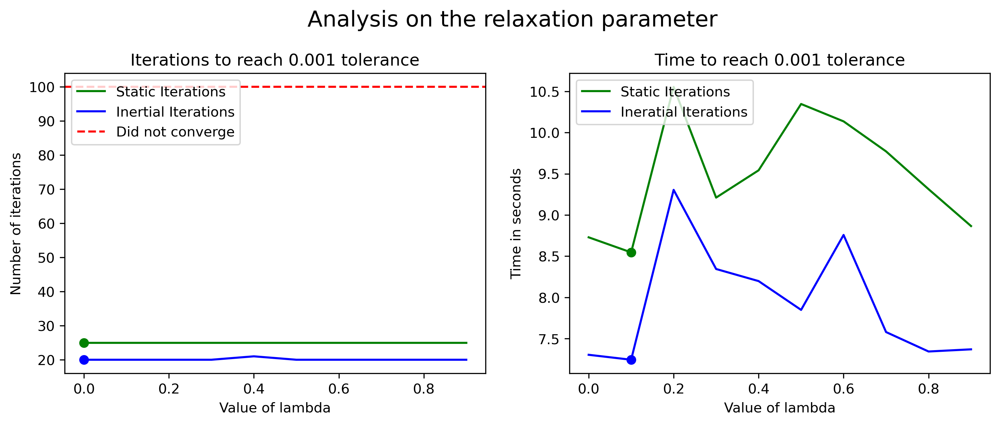

  lambda    Its Static    Time Static    Its Inertial    Time Inertial
--------  ------------  -------------  --------------  ---------------
     0              25        8.72899              20          7.30287
     0.1            25        8.54598              20          7.24288
     0.2            25       10.5548               20          9.30486
     0.3            25        9.21105              20          8.34434
     0.4            25        9.54232              21          8.1975
     0.5            25       10.3473               20          7.84791
     0.6            25       10.1364               20          8.75755
     0.7            25        9.77182              20          7.57884
     0.8            25        9.31335              20          7.3429
     0.9            25        8.86575              20          7.36917


In [6]:
Exp = ExpLambda(np.arange(0, 1.1, 0.1), rho = 1, ratio = 0.5)
Exp.run(max_iterations = 100, tolerance = 1e-3, title="Analysis on the relaxation parameter")

## Final Result
In this final section we erase $50\%$ of the pixels randomly, select a step size of $\rho=1.6$ and a relaxation parameter of $\lambda=X$ (Yet to be determined), and observe this beautiful result. This runs in less than a minutes.

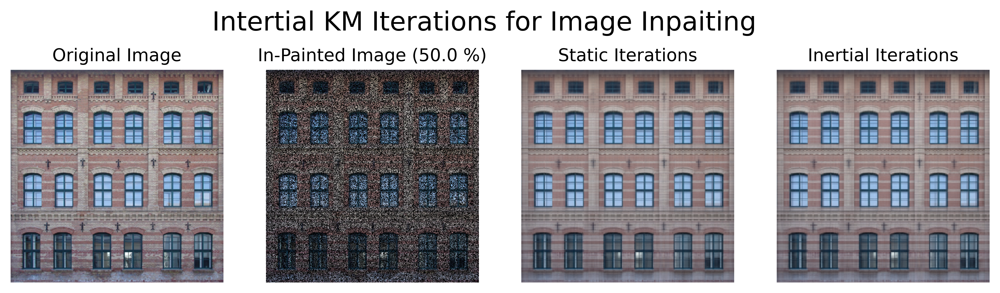

In [2]:
## Import the Image
Img = Image(image="Houses.jpeg", ratio=0.5, resize=(512, 512))

# Get Static Solution
IP_static = InPainter(Img, alpha_static = True, lamb = 1, rho = 1.6)
sol_static, _, conv_static = IP_static.run(max_iterations = 150, tolerance = 1e-3)

# Get Inertial Solution
IP_inertial = InPainter(Img, alpha_static = False, lamb = 1, rho = 1.6)
sol_inertial, _, conv_inertial = IP_inertial.run(max_iterations = 150, tolerance = 1e-3)

# Plot Both Solutions
Img.visualize([sol_static, "Static Iterations"], 
              [sol_inertial, "Inertial Iterations"], 
              title="Intertial KM Iterations for Image Inpaiting")

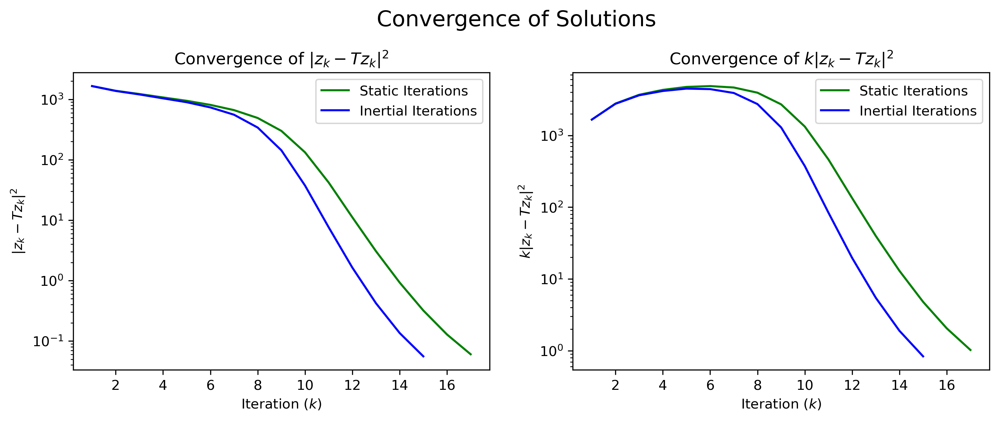

In [5]:
plot_convergence(conv_static, conv_inertial)